In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

Why Object detection requires binary image?

OpenCV needs a clear separation of object (foreground) and background, and a binary image gives that.
Contours = boundaries of white regions.

cv2.THRESH_BINARY_INV

1. Objects → black
2. Background → white


cv2.THRESH_BINARY

Objects → white (what is actually needed for obj detection)
Background → black

### Q1. Write a Python program to detect all objects in an image named "nuts_bolts.jpg" using thresholding and contour detection, count them, and compute summary statistics such as:​

1. mean area​
2. median area​
3. largest object area​
4. smallest object area​
5. Print the analysis clearly.

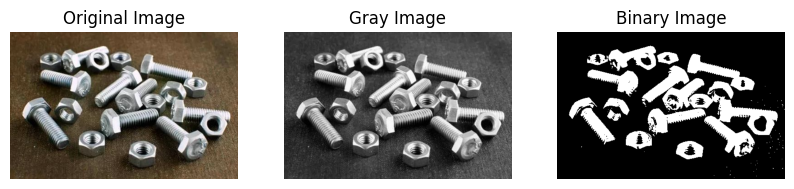

In [28]:
img = cv2.imread('nut_bolts2.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,120,255,cv2.THRESH_BINARY) #Use BINARY_INV Objects become white. Background becomes black

plt.figure(figsize = (10,4)) # width x height

plt.subplot(1,3,1)
plt.imshow(img)
plt.axis('off')
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.axis('off')
plt.title("Gray Image")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.axis('off')
plt.title('Binary Image')

plt.show()

* If pixel value > 120 → object
* If pixel value ≤ 120 → background

if gray(x,y) > 120:
    binary(x,y) = 255
else:
    binary(x,y) = 0

### Use Morphological Opening to Separate Touching Objects

In [1]:
kernel = np.ones((5,5), np.uint8)
clean = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel) # Opening: Erosion + dilation

NameError: name 'np' is not defined

Erosion : Removes small noise from the binary image while preserving real object shapes

* cv2.findContours(...) Extracts all object boundaries from the binary image.​
* binary: The black & white segmented image.​
* cv2.RETR_EXTERNAL: Retrieves only outer contours (ignores internal holes).​
* cv2.CHAIN_APPROX_SIMPLE: Compresses contour points for efficient storage.​
* contours: List containing all detected object boundaries (each is a list of points).​
* hierarchy: Contains parent-child relationships (not used here).

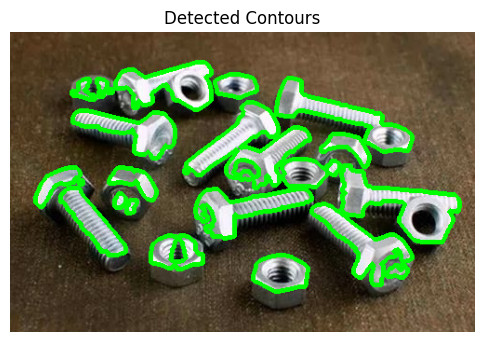

In [41]:
contours,hierarchy = cv2.findContours(clean,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

# Makes a copy of original image.​
# Draws green contours on detected object boundaries.​
# -1 means “draw all contours.”​
# Thickness = 3 px.
    
plt.figure(figsize = (6,6))
plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()


In [42]:
print("Before:", len(contours))
print("After:", len(contours))

Before: 20
After: 20


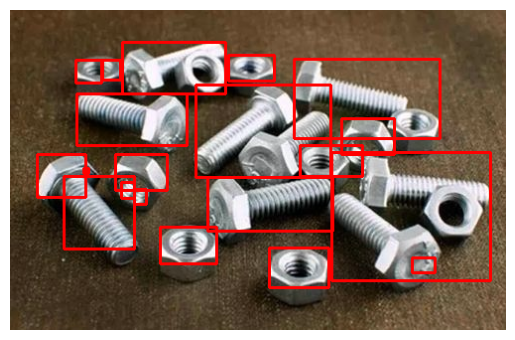

In [47]:
output = img.copy()
count = 0
for cnt in contours:
    count+=1
    x,y,w,h = cv2.boundingRect(cnt)
    cv2.rectangle(output,(x,y),(x+w,y+h),(255,0,0),2)
plt.imshow(output)
plt.axis('off')
plt.show()


cv2.boundingRect(cnt) : finds the smallest upright rectangle that fully contains the contour.

Returns:
* x → leftmost x-coordinate
* y → topmost y-coordinate
* w → width of rectangle
* h → height of rectangle

cv2.rectangle(image, start_point, end_point, color, thickness)
* (x, y) → top-left corner
* (x+w, y+h) → bottom-right corner

In [49]:
import numpy as np

# areas of all detected contours
areas = [cv2.contourArea(cnt) for cnt in contours]

# convert to numpy array for easy stats
areas = np.array(areas)


mean_area = np.mean(areas)
median_area = np.median(areas)
largest_area = np.max(areas)
smallest_area = np.min(areas)


print("------ OBJECT AREA ANALYSIS ------")
print(f"Total objects detected : {len(areas)}")
print(f"Mean area              : {mean_area:.2f}")
print(f"Median area            : {median_area:.2f}")
print(f"Largest object area    : {largest_area:.2f}")
print(f"Smallest object area   : {smallest_area:.2f}")
print("----------------------------------")


------ OBJECT AREA ANALYSIS ------
Total objects detected : 20
Mean area              : 1744.70
Median area            : 1058.50
Largest object area    : 7507.00
Smallest object area   : 16.00
----------------------------------


### Q2. Load "shapes2.png", detect all contours, classify each object as triangle, square/rectangle, or circle, and create a table (using a list of dictionaries or pandas DataFrame) summarizing:
1. object ID
2. shape
3. area
4. perimeter
Display the DataFrame.

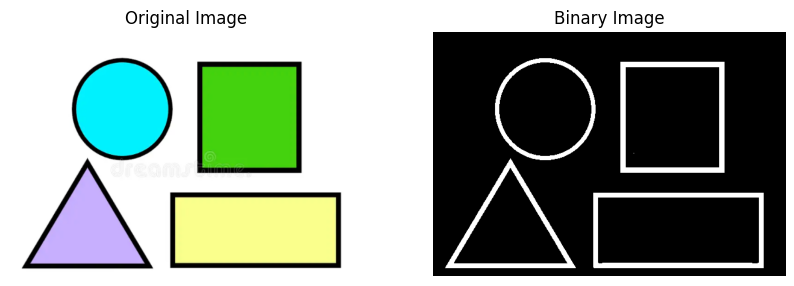

In [8]:
img = cv2.imread("shapes2.png")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,120,255,cv2.THRESH_BINARY_INV)

plt.figure(figsize = (10,4)) # width x height

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis('off')
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(binary,cmap = 'gray')
plt.axis('off')
plt.title("Binary Image")

plt.show()


### Contour Detection

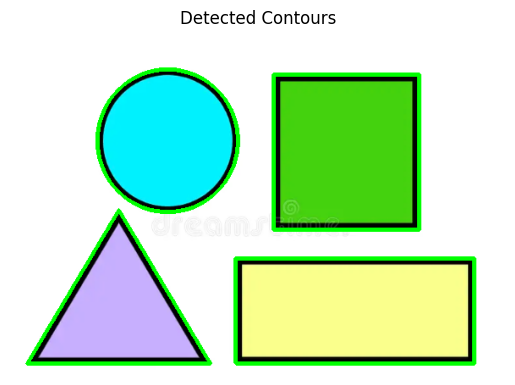

In [9]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()


1. approx = cv2.approxPolyDP(cnt, 0.04 * peri, True)
    * Every contour has many points.
    * approxPolyDP simplifies the contour into fewer points.
    * 0.04 * peri controls how much simplification (4% of perimeter).
    * Result:
        * A triangle becomes 3 points
        * A rectangle becomes 4 points
        * A circle becomes many points, but simplification makes it 8–10 points

2. Checking if corners == 4 for Square/Rectangle
    * x, y, w, h = cv2.boundingRect(approx)
      * Draws the smallest box around the shape.
      * w = width of the box
      * h = height of the box
    * aspect_ratio = w / float(h)
      * Squares have width ≈ height → ratio ≈ 1
      * Rectangles have width ≠ height → ratio far from 1
    * if 0.95 < aspect_ratio < 1.05:
      * If ratio is very close to 1 → Square
      * else rectangle

Rectangle: 2.264
Square: 0.9402173913043478


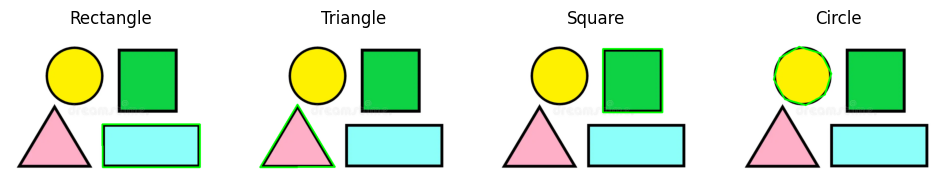

In [18]:
import pandas as pd

data = []

plt.figure(figsize=(12, 4))

for i, cnt in enumerate(contours, start=1):
    peri = cv2.arcLength(cnt, True)
    area = cv2.contourArea(cnt)
    approx = cv2.approxPolyDP(cnt, 0.04 * peri, True) # simplifies a contour into a polygon with fewer points while preserving the shape.
    corners = len(approx)

    # classify shape
    if corners == 3:
        shape = "Triangle"
    elif corners == 4:
        x, y, w, h = cv2.boundingRect(approx)
        aspect_ratio = w / float(h)
        if 0.94 <= aspect_ratio <= 1.05:
            shape = "Square"  
        else:
            shape = "Rectangle"
    else:
        shape = "Circle"

    data.append({
        "Object ID": i,
        "Shape": shape,
        "Area": area,
        "Perimeter": peri
    })

    # draw contour on a fresh image
    temp = img.copy()
    cv2.drawContours(temp, [approx], -1, (0,255,0), 3)

    # display in subplot i
    plt.subplot(1, len(contours), i)
    plt.imshow(cv2.cvtColor(temp, cv2.COLOR_BGR2RGB))
    plt.title(shape)
    plt.axis('off')

plt.show()
df = pd.DataFrame(data)


In [19]:
df

,Object ID,Shape,Area,Perimeter
0,1,Rectangle,34967.5,811.414214
1,2,Triangle,19562.0,667.470124
2,3,Square,31476.0,710.000000
3,4,Circle,21958.0,554.357424


### Q3. Read an image "metal_parts.png". Detect all parts using contour detection. Then identify defective parts where:​ the convexity defect count is > 5 OR area is below a threshold 
Calculate and print:​
1. total parts​
2. defective parts​
3. defect percentage​

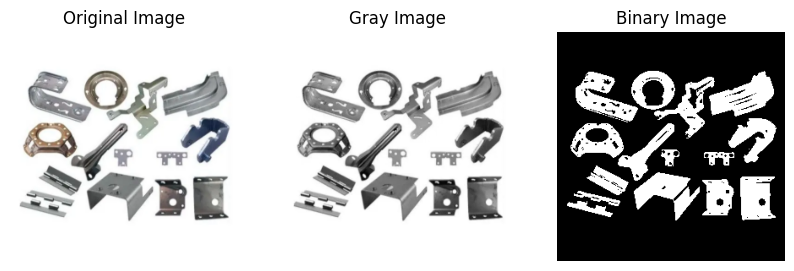

In [28]:
img = cv2.imread("metal_parts.png")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,180,255,cv2.THRESH_BINARY_INV)

plt.figure(figsize = (10,4))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.title("Gray Image")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.title("Binary Image")
plt.axis("off")

plt.show()


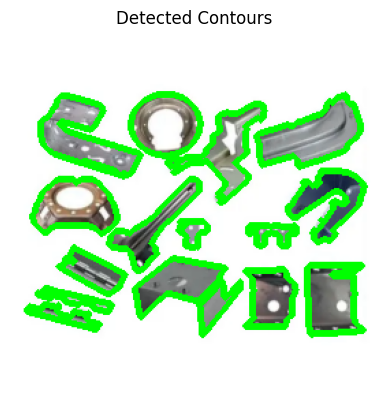

In [29]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [32]:
defective_count = 0
area_threshold = 1500   

for cnt in contours:

    # --- Compute area ---
    area = cv2.contourArea(cnt)

    # --- Compute convex hull for drawing (points) ---
    hull_points = cv2.convexHull(cnt) # Returns coordinates of the hull boundary

    # --- Compute convex hull for defects (indices) ---
    hull_indices = cv2.convexHull(cnt, returnPoints=False) # Returns indices of contour points

    defect_count = 0
    if hull_indices is not None and len(hull_indices) > 3:
        try:
            defects = cv2.convexityDefects(cnt, hull_indices)
            if defects is not None:
                defect_count = defects.shape[0]
        except:
            defect_count = 0   # if error → treat as no defects

    # --- 4. Mark defective ---
    if defect_count > 5 or area < area_threshold:
        defective_count += 1


defects = cv2.convexityDefects(cnt, hull_indices) returns (N, 1, 4)

where :
* N is no. of defects
* 1 is for OpenCV internal formatting
* 4 means 4 values [start_index, end_index, farthest_index, depth] = [Where dent starts, Where dent ends, Deepest point inside, How deep the dent is]
* In code we just extract no. of defects

In [33]:
total_parts = len(contours)
defect_percentage = (defective_count / total_parts) * 100

print("Total parts:", total_parts)
print("Defective parts:", defective_count)
print("Defect percentage: {:.2f}%".format(defect_percentage))


Total parts: 20
Defective parts: 19
Defect percentage: 95.00%


### Q4. Load "coins.jpg", segment each coin, compute each coin's radius using enclosing circles. Assume radius ranges represent denominations:
* small = Rs1
* medium = Rs2
* large = Rs5

### Calculate total monetary value of coins in the image

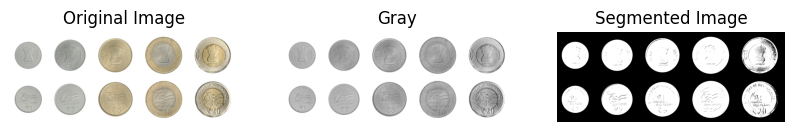

In [70]:
img = cv2.imread("coins.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# Otsu automatically chooses the best threshold value instead of you guessing one. Best for images having uneven lighting
# Otsu returns obj as black and background as white. Combining with INV we get obj as white and background as white
_,binary = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) 

plt.figure(figsize = (10,4))

plt.subplot(1,3,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.axis("Off")
plt.title("Segmented Image")

plt.show()

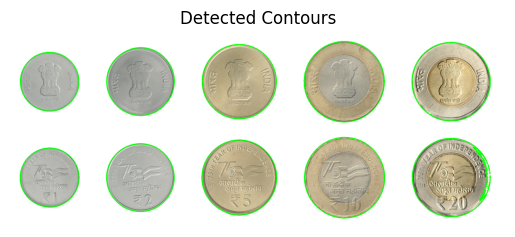

In [71]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [95]:
circles = []
radii = []
for i,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True) # True - Closed Shape

    if perimeter == 0:
        continue

    # Checking if the given image contour leads to circle
    circularity = 4 * np.pi * area / (perimeter * perimeter)

    if circularity > 0.75:
        r = perimeter / (2*np.pi)
        radii.append(round(r))
        circles.append(perimeter)

Understanding formula: circularity = 4 * np.pi * area / (perimeter * perimeter)

Imagine you have a rope:
* You can make a circle with it Or a zig-zag shape. Both use the same rope length.
* But: The circle covers more space. The zig-zag covers less space
So circle = more area for the same boundary

If you calculate the final formula value for circle it would be 1.

Other shapes:
* Have less area for the same boundary
* Or more boundary for the same area

So:
* Numerator (area part) becomes smaller
* Denominator (perimeter² part) becomes larger

In [96]:
print(radii)

[143, 164, 186, 197, 142, 168, 181, 197, 198]


In [97]:
# Radii value computed manually
total = 0
for r in radii:
    if r <= 150:
        total += 1    # Rs1
    elif r>150 and r<=180:
        total += 2    # Rs2
    else:
        total += 5    # Rs5

In [98]:
print(total)

31


### Q5. Detect all objects in "items.png", extract bounding box coordinates, and then generate a scatter-like plot of object centroids (x,y). Perform a simple analysis:
* Which quadrant has the most objects?
* Are objects clustered or spread uniformly?

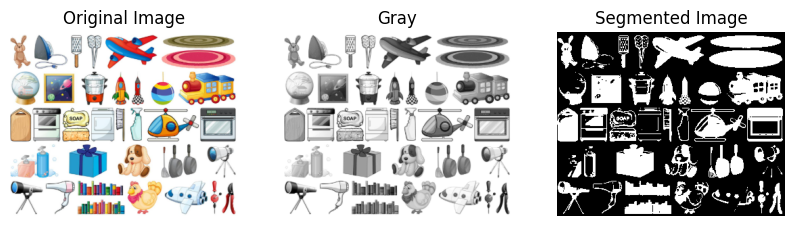

In [4]:
img = cv2.imread("items.png")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

plt.figure(figsize = (10,4))

plt.subplot(1,3,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.axis("Off")
plt.title("Segmented Image")

plt.show()

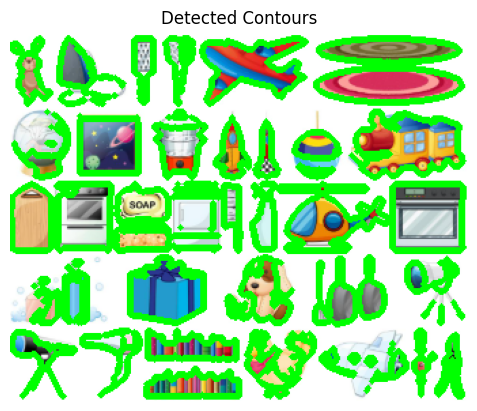

In [5]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

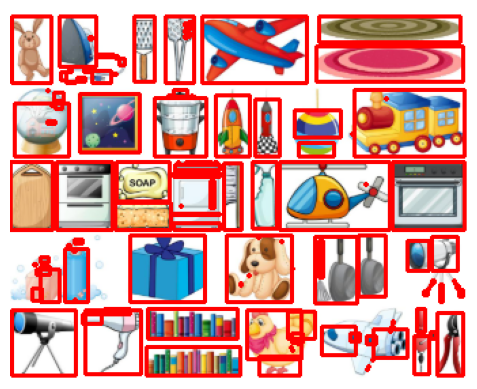

In [6]:
output = img.copy()
count = 0
x_centroid = []
y_centroid = []
for cnt in contours:
    count+=1
    x,y,w,h = cv2.boundingRect(cnt)

    # This works because x, y are the top-left corner of the rectangle, and w, h are the width and height. Adding half of the width/height gives the center.
    cx = x + w / 2
    cy = y + h / 2

    x_centroid.append(cx)
    y_centroid.append(cy)
    
    cv2.rectangle(output,(x,y),(x+w,y+h),(255,0,0),2) # cv2.rectangle(image, start_point, end_point, color, thickness)
plt.imshow(output)
plt.axis('off')
plt.show()

In [7]:
print(len(y_centroid))

123


In [9]:
h, w = img.shape[:2]

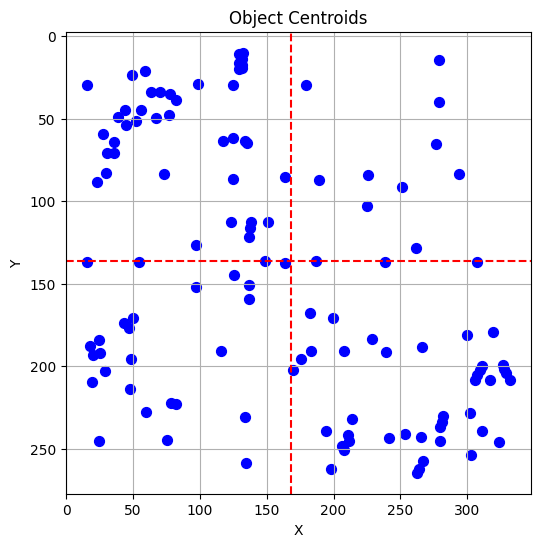

In [10]:
plt.figure(figsize=(6,6))  # 6 inches × 6 inches
plt.scatter(x_centroid, y_centroid, color='blue', s=50)  # s = size of points

plt.axvline(x=w/2, color='red', linestyle='--')  # vertical line
plt.axhline(y=h/2, color='red', linestyle='--')  # horizontal line

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Object Centroids')
plt.grid(True)
plt.gca().invert_yaxis()
plt.show()

In [11]:
h, w = img.shape[:2]

# Quadrant counters
q1 = 0  # top-left
q2 = 0  # top-right
q3 = 0  # bottom-left
q4 = 0  # bottom-right

for cx, cy in zip(x_centroid, y_centroid):
    if cx < w/2 and cy < h/2:
        q1 += 1
    elif cx >= w/2 and cy < h/2:
        q2 += 1
    elif cx < w/2 and cy >= h/2:
        q3 += 1
    else:
        q4 += 1

print("Top-left quadrant:", q1)
print("Top-right quadrant:", q2)
print("Bottom-left quadrant:", q3)
print("Bottom-right quadrant:", q4)


Top-left quadrant: 42
Top-right quadrant: 10
Bottom-left quadrant: 27
Bottom-right quadrant: 44


In [12]:
# Convert centroids into points. zip combines into (x1, y1), (x2, y2), (x3, y3) ...
points = np.array(list(zip(x_centroid, y_centroid)))

# Compute pairwise distances
distances = []

for i in range(len(points)):
    for j in range(i+1, len(points)):
        
        # This is the Euclidean distance formula:
        d = np.linalg.norm(points[i] - points[j])
        distances.append(d)

# Average distance summarizes overall spacing
avg_distance = np.mean(distances)
print("Average distance between objects:", avg_distance)

Average distance between objects: 160.37576210549918


In [14]:
# This is the maximum possible distance in the image (top-left to bottom-right).We need this so our distance comparison is scale-independent.
image_diag = np.sqrt(w**2 + h**2)

# It’s a simple threshold, If objects are on average closer than ~50% of image size → clustered otherwise uniformly spread
if avg_distance < image_diag / 2:
    print("Objects are CLUSTERED")
else:
    print("Objects are UNIFORMLY SPREAD")


Objects are CLUSTERED


### Q6. Extract contour areas from "geometric_objects.jpg".Plot a histogram of all contour areas using Matplotlib. Interpret:
* Do objects have similar sizes?
* Are there outliers?
Write a short comment.

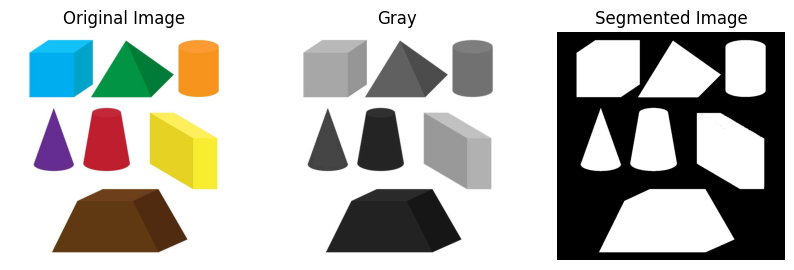

In [4]:
img = cv2.imread("geometric_shapes.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,200,255,cv2.THRESH_BINARY_INV)

plt.figure(figsize = (10,4))

plt.subplot(1,3,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.subplot(1,3,3)
plt.imshow(binary,cmap = 'gray')
plt.axis("Off")
plt.title("Segmented Image")

plt.show()

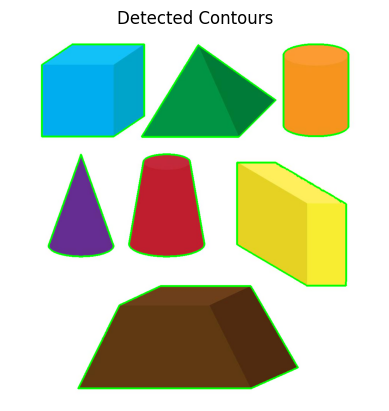

In [5]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [8]:
area = []
for i,cnt in enumerate(contours):
    value = cv2.contourArea(cnt)
    area.append(value)
    print(value)

120495.0
73823.5
24637.5
42293.5
48489.5
39859.0
61750.0


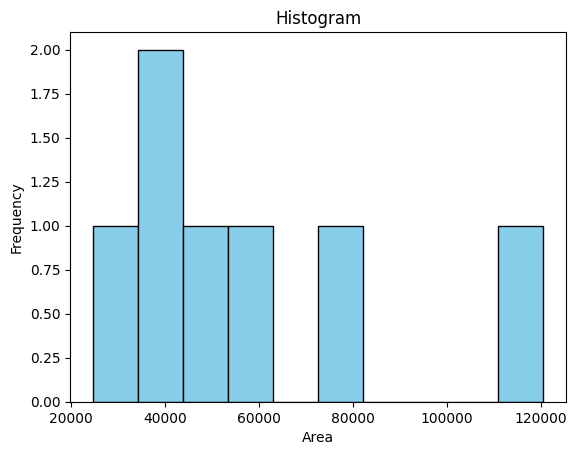

In [9]:
plt.hist(area,color='skyblue', edgecolor='black')

# Adding labels and title
plt.xlabel('Area')
plt.ylabel('Frequency')
plt.title('Histogram')

# Display the plot
plt.show()

The histogram displays distribution of the area of shapes. 
* The tallest bar is in the range of approximately 33,000 to 46,000. This means the most common size for a shape's area is within this relatively smaller range.
* There is a gap in the data between the bin from 72,000-85,000 and the final bin from 111,000-124,000. The single shape in that last bin is significantly larger than the others, suggesting an outlier or a shape of a distinctly different size class.
* The distribution is highly skewed to the right (positively skewed) and non-uniform.

### Q7. Using "crops.jpg", apply:​
* global thresholding​
* adaptive thresholding​
### For each method, count detected objects and calculate:​
* mean object area​
* number of missed objects
  
Print a comparison table.

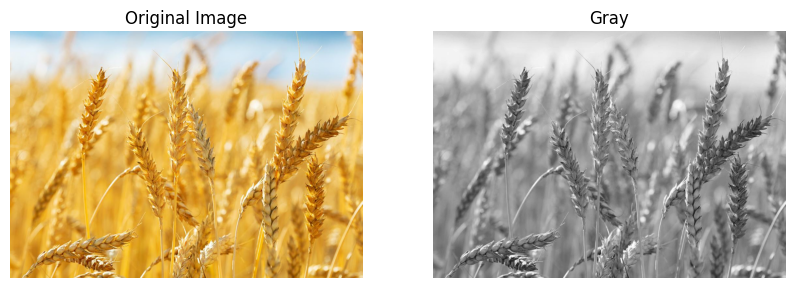

In [14]:
img = cv2.imread("crops.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize = (10,4))

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.show()

# Global Thresholding:

In [54]:
global_thresh = {}

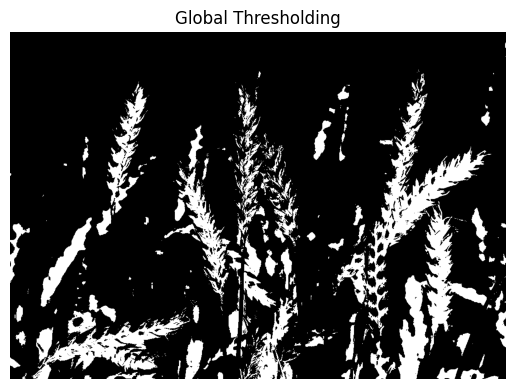

In [55]:
T = 120
_,binary = cv2.threshold(gray,T,255,cv2.THRESH_BINARY_INV)
plt.imshow(binary,cmap = 'gray')
plt.title("Global Thresholding")
plt.axis('off')
plt.show()

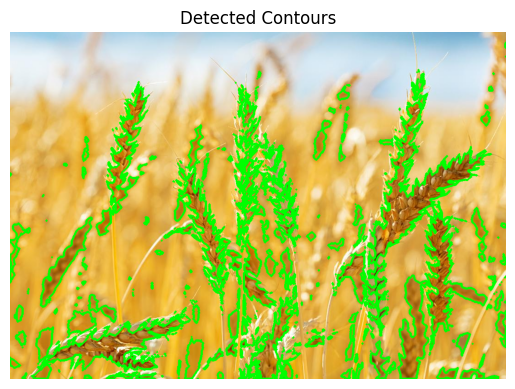

In [56]:
contours,hierarchy = cv2.findContours(binary,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [57]:
num_detected = len(contours)
print("Detected objects:", num_detected)
global_thresh['Detected Object (Before Erosion)'] = num_detected

Detected objects: 770


In [58]:
areas = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    areas.append(area)

In [59]:
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)
global_thresh['Mean Area (Before Erosion)'] = mean_area

Mean object area: 164.45909090909092


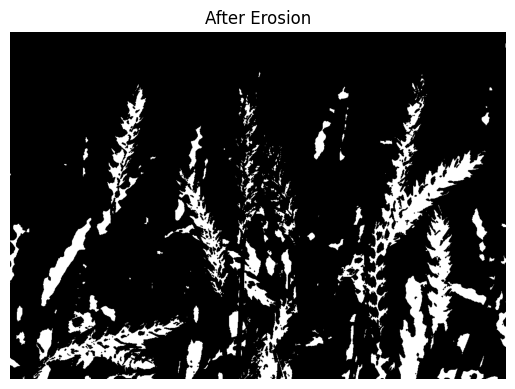

In [60]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
eroded = cv2.erode(binary, kernel, iterations=1)

plt.imshow(eroded, cmap='gray')
plt.title("After Erosion")
plt.axis('off')
plt.show()

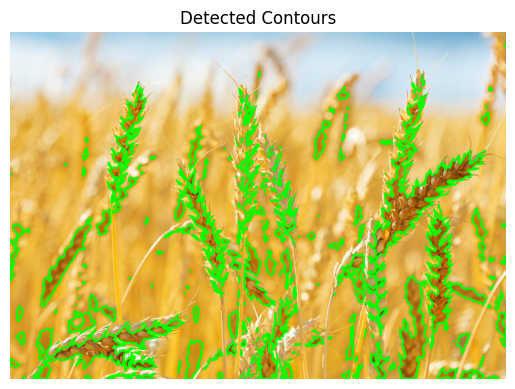

In [61]:
contours,hierarchy = cv2.findContours(eroded,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [62]:
num_detected = len(contours)
print("Detected objects:", num_detected)
global_thresh['Detected Object (After Erosion)'] = num_detected

Detected objects: 537


In [63]:
areas = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    areas.append(area)
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)
global_thresh['Mean Area (After Erosion)'] = mean_area

Mean object area: 177.96648044692736


In [64]:
print(global_thresh)

{'Detected Object (Before Erosion)': 770, 'Mean Area (Before Erosion)': 164.45909090909092, 'Detected Object (After Erosion)': 537, 'Mean Area (After Erosion)': 177.96648044692736}


# Adaptive Thresholding

In [65]:
adap_thresh = {}

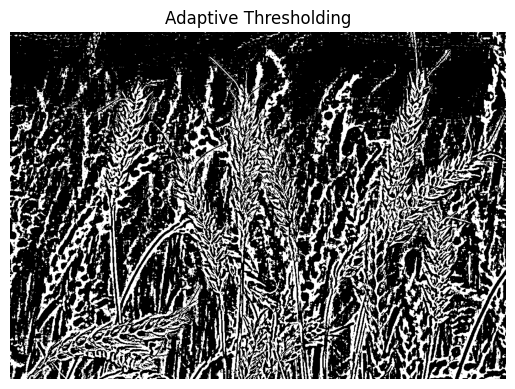

In [66]:
# It converts a grayscale image into a binary image by computing a local threshold for each pixel based on the mean intensity of its neighborhood.
binary_adaptive = cv2.adaptiveThreshold(
    gray,
    255, # Maximum value assigned to pixels that satisfy the threshold condition
    cv2.ADAPTIVE_THRESH_MEAN_C, # Method used to calculate the local threshold
    cv2.THRESH_BINARY_INV, # Thresholding type
    11, # Size of the local neighborhood
    2 # A constant subtracted from the local mean
)

plt.imshow(binary_adaptive, cmap='gray')
plt.title("Adaptive Thresholding")
plt.axis('off')
plt.show()


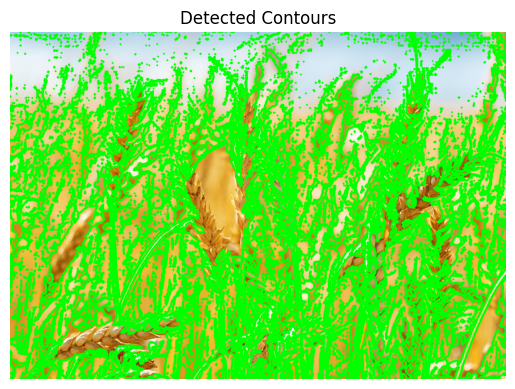

In [67]:
contours,hierarchy = cv2.findContours(binary_adaptive,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [68]:
num_detected = len(contours)
print("Detected objects:", num_detected)
adap_thresh['Detected Object (Before Erosion)'] = num_detected

Detected objects: 4006


In [69]:
areas = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    areas.append(area)
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)
adap_thresh['Mean Area (Before Erosion)'] = mean_area

Mean object area: 58.5481777333999


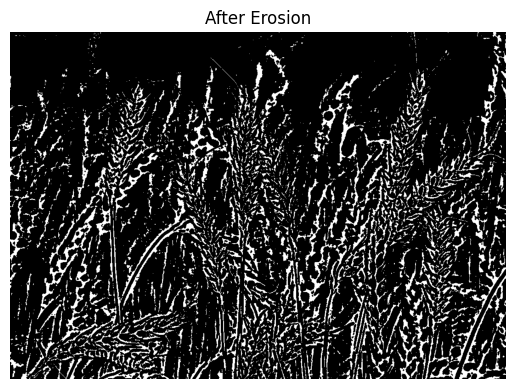

In [70]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
eroded = cv2.erode(binary_adaptive, kernel, iterations=1)

plt.imshow(eroded, cmap='gray')
plt.title("After Erosion")
plt.axis('off')
plt.show()

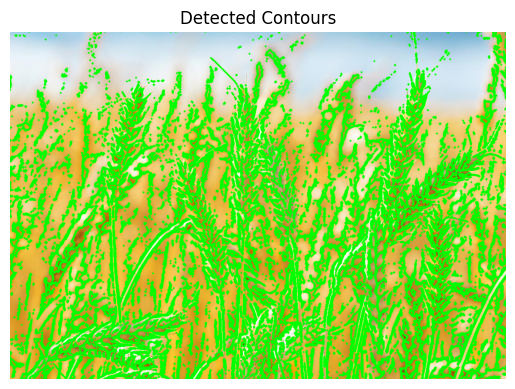

In [71]:
contours,hierarchy = cv2.findContours(eroded,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()

cv2.drawContours(contour_img,contours,-1,(0,255,0),3)

plt.imshow(contour_img)
plt.title("Detected Contours")
plt.axis('off')
plt.show()

In [72]:
num_detected = len(contours)
print("Detected objects:", num_detected)
adap_thresh['Detected Object (After Erosion)'] = num_detected

Detected objects: 3271


In [73]:
areas = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    areas.append(area)
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)
adap_thresh['Mean Area (After Erosion)'] = mean_area

Mean object area: 24.797156832772853


In [74]:
print(adap_thresh)

{'Detected Object (Before Erosion)': 4006, 'Mean Area (Before Erosion)': 58.5481777333999, 'Detected Object (After Erosion)': 3271, 'Mean Area (After Erosion)': 24.797156832772853}


In [78]:
import pandas as pd
df = pd.DataFrame([global_thresh,adap_thresh],index = ['Global Thresh','Adap Thresh'])
df

,Detected Object (Before Erosion),Mean Area (Before Erosion),Detected Object (After Erosion),Mean Area (After Erosion)
Global Thresh,770,164.459091,537,177.966480
Adap Thresh,4006,58.548178,3271,24.797157


Global:
* Detects very few objects (537).
* Indicates severe under-segmentation.
* Many crops are missed, especially those in darker or brighter regions.
* Large mean area suggests multiple crops merged into single blobs.

Adaptive:
* Detects ~6× more objects (3271).
* Captures crops across varying lighting conditions.
* Much smaller mean area indicates better object separation.

1. Adaptive thresholding significantly improves object detection.
2. Erosion improves segmentation quality, especially for adaptive thresholding.

MISSED OBJECTS = 3271 − 537 = 2734. Treating adaptive as baseline (2731/3271) * 100 = 83.6%

### Q8. Add Gaussian noise to "packets.jpg", then detect contours before and after applying median filtering.​
Calculate: 
* difference in number of contours​
* change in average area​
* percentage improvement in detection accuracy

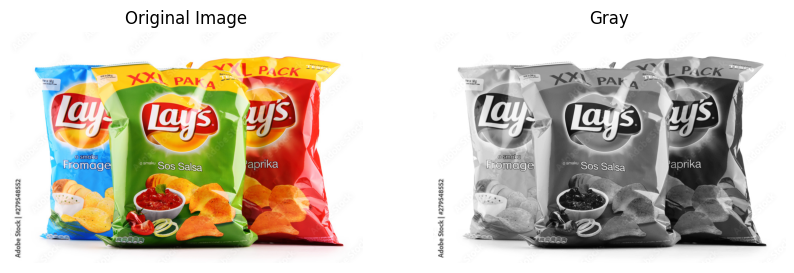

In [45]:
img = cv2.imread("packets.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize = (10,4))

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.show()

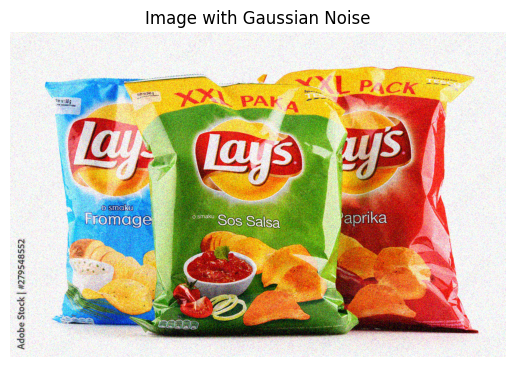

In [55]:
noise = np.random.normal(0, 25, img.shape).astype(np.float32)
gaussian_img = cv2.add(img.astype(np.float32), noise)
gaussian_img = np.clip(gaussian_img, 0, 255).astype(np.uint8)

plt.imshow(gaussian_img)
plt.title("Image with Gaussian Noise")
plt.axis("off")
plt.show()

# Before Median Filtering

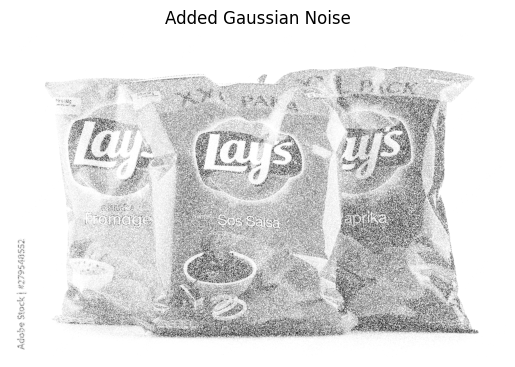

In [56]:
gray_noisy = cv2.cvtColor(gaussian_img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray_guassian,cmap = 'gray')
plt.title("Added Gaussian Noise")
plt.axis('off')
plt.show()

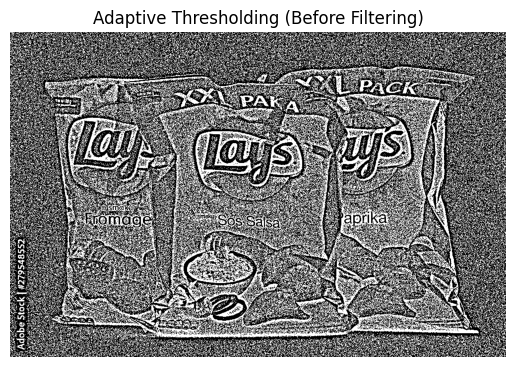

In [57]:
binary_before = cv2.adaptiveThreshold(
    gray_noisy,
    255,
    cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY_INV,
    11,
    2
)

plt.imshow(binary_before, cmap='gray')
plt.title("Adaptive Thresholding (Before Filtering)")
plt.axis("off")
plt.show()

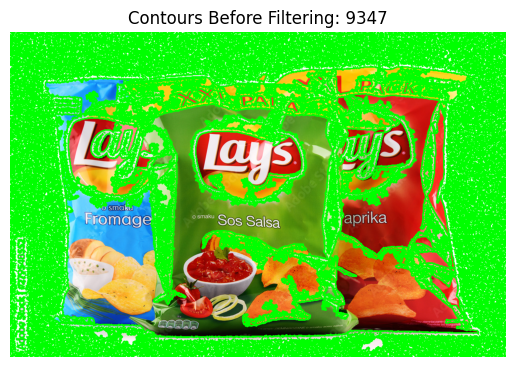

In [58]:
contours_before, _ = cv2.findContours(
    binary_before,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

contour_img_before = img.copy()
cv2.drawContours(contour_img_before, contours_before, -1, (0,255,0), 2)

plt.imshow(contour_img_before)
plt.title(f"Contours Before Filtering: {len(contours_before)}")
plt.axis("off")
plt.show()

areas_before = [cv2.contourArea(c) for c in contours_before]
mean_area_before = np.mean(areas_before) if areas_before else 0

In [18]:
areas = []
for cnt in contours_before_filtering:
    area = cv2.contourArea(cnt)
    areas.append(area)
mean_area = sum(areas) / len(areas) if areas else 0
print("Mean object area:", mean_area)

Mean object area: 104.29058856980382


# After Median Filtering

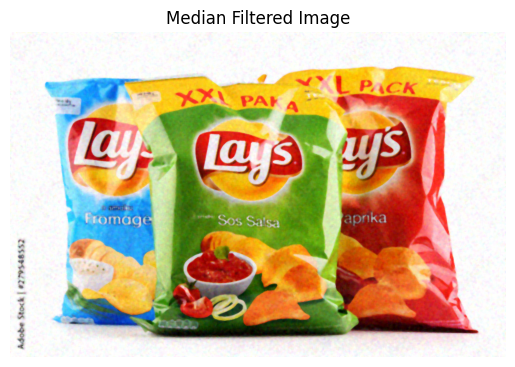

In [59]:
median_filtered = cv2.medianBlur(gaussian_img, 5)

plt.imshow(median_filtered)
plt.title("Median Filtered Image")
plt.axis("off")
plt.show()

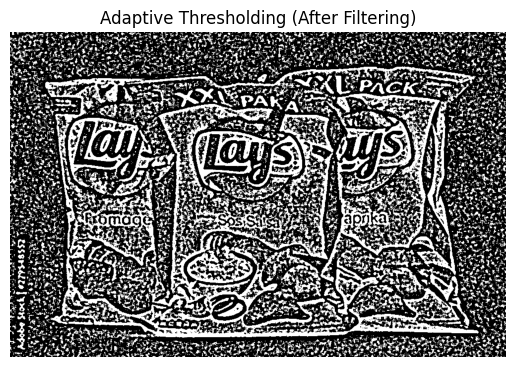

In [60]:
gray_median = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)

binary_after = cv2.adaptiveThreshold(
    gray_median,
    255,
    cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY_INV,
    11,
    2
)

plt.imshow(binary_after, cmap='gray')
plt.title("Adaptive Thresholding (After Filtering)")
plt.axis("off")
plt.show()


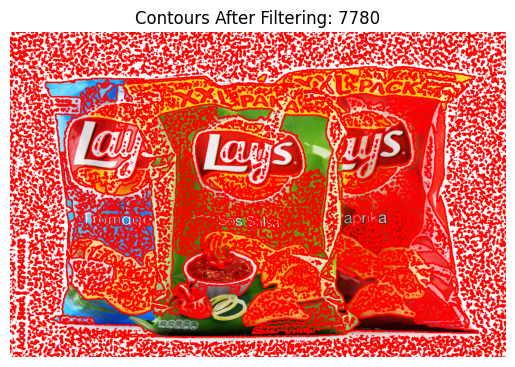

In [61]:
contours_after, _ = cv2.findContours(
    binary_after,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

contour_img_after = img.copy()
cv2.drawContours(contour_img_after, contours_after, -1, (255,0,0), 2)

plt.imshow(contour_img_after)
plt.title(f"Contours After Filtering: {len(contours_after)}")
plt.axis("off")
plt.show()

areas_after = [cv2.contourArea(c) for c in contours_after]
mean_area_after = np.mean(areas_after) if areas_after else 0


In [62]:
# Difference in number of contours
contour_difference = len(contours_after) - len(contours_before)

# Change in average contour area
area_change = mean_area_after - mean_area_before

# Percentage improvement in detection accuracy
# (Assuming median-filtered result is closer to ground truth)
accuracy_improvement = (
    abs(len(contours_before) - len(contours_after)) / len(contours_before)
) * 100 if len(contours_before) != 0 else 0

print("Number of contours before filtering :", len(contours_before))
print("Number of contours after filtering  :", len(contours_after))
print("Difference in contours              :", contour_difference)

print("\nMean contour area before filtering :", mean_area_before)
print("Mean contour area after filtering  :", mean_area_after)
print("Change in mean area                :", area_change)

print("\nPercentage improvement in detection accuracy : {:.2f}%".format(accuracy_improvement))


Number of contours before filtering : 9347
Number of contours after filtering  : 7780
Difference in contours              : -1567

Mean contour area before filtering : 35.758157697657005
Mean contour area after filtering  : 26.292480719794344
Change in mean area                : -9.46567697786266

Percentage improvement in detection accuracy : 16.76%


Adaptive thresholding was chosen over global and Otsu thresholding because Gaussian noise introduces local intensity variations that violate the assumptions of global methods. Adaptive thresholding computes local thresholds, making it more robust to noise and ensuring that improvements observed after median filtering reflect true enhancement in object detection accuracy.

Why not otsu?
* Otsu’s method decides a threshold by looking at the overall brightness distribution (histogram) of the image.
* When gaussian noise is added, random bright and dark pixels appear everywhere and the brightness distribution becomes messy and spread out. Because of this Otsu picks a wrong or unstable threshold

Why not Global?
* Global thresholding uses one fixed value to separate objects from the background.
* When gaussian noise is added, pixel brightness changes randomly across the image : some background pixels become darker while some object pixels become brighter. Since the threshold is fixed noise pixels are mistaken as objects and real objects get broken into pieces

### Q9. Detect all rectangular objects in "boxes.png".For each bounding rectangle, compute the angle of orientation using minAreaRect().​
Create a list showing:​
* box ID​
* angle​
* area​
  
Then analyse:​
* Are most boxes aligned?​
* Any rotated boxes indicating misplacement?

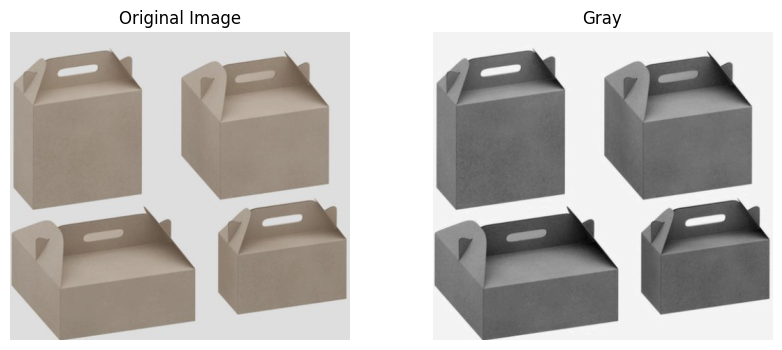

In [5]:
img = cv2.imread("boxes2.png")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.figure(figsize = (10,4))

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis("Off")
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(gray,cmap = 'gray')
plt.axis("off")
plt.title("Gray")

plt.show()

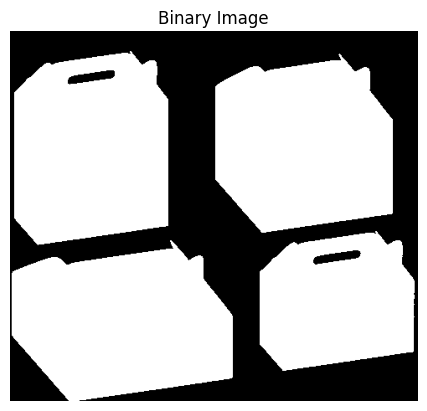

In [10]:
# Binary threshold
_, binary = cv2.threshold(
    gray, 200, 255,
    cv2.THRESH_BINARY_INV
)

plt.imshow(binary, cmap='gray')
plt.title("Binary Image")
plt.axis("off")
plt.show()

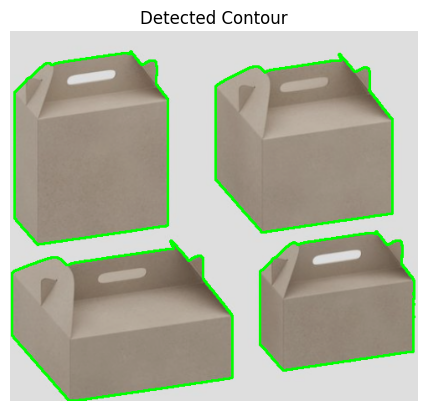

In [11]:
contours, _ = cv2.findContours(
    binary,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)
img_contour= img.copy()
cv2.drawContours(img_contour, contours, -1, (0,255,0), 2)
plt.imshow(img_contour)
plt.title("Detected Contour")
plt.axis("off")
plt.show()

In [12]:
results = []  # stores box_id, angle, area

output = img.copy()
box_id = 1

for cnt in contours:
    area = cv2.contourArea(cnt)
    
    # Ignore very small objects (noise)
    if area < 500:
        continue
    
    rect = cv2.minAreaRect(cnt)
    (cx, cy), (w, h), angle = rect
    
    # Normalize angle 
    if w < h:
        angle = angle + 90
    
    # Box points
    box = cv2.boxPoints(rect) # Converts the rectangle into 4 corner points
    box = box.astype(int) # convert into integer
    
    # Draw rectangle
    cv2.drawContours(output, [box], 0, (0,255,0), 2)
    
    results.append({
        "Box ID": box_id,
        "Angle (deg)": round(angle, 2),
        "Area": round(area, 2)
    })
    
    box_id += 1


rect = cv2.minAreaRect(cnt): Finds the smallest possible rotated rectangle that completely covers the contour.

1. (cx, cy), (w, h), angle = rect
* (cx, cy) : The x and y coordinates of the rectangle’s center.
* (w,h) : Dimensions of the rectangle.
* angle: Angle of the rectangle in degrees

2. Normalizing angle :  angle = angle + 90
* Think of holding a phone:
     * Screen upright → portrait mode
     * Screen sideways → landscape mode
* If OpenCV thinks your phone is sideways when it’s upright, you rotate it 90° to correct it.
* OpenCV Width and height are swapped internally. The angle points in the wrong direction. To correct it we rotate the angle by 90 degrees

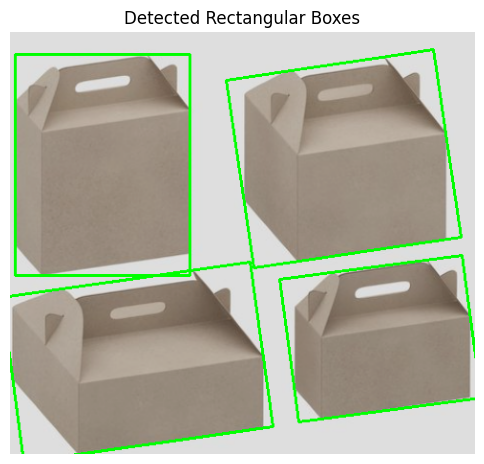

In [13]:
plt.figure(figsize=(6,6))
plt.imshow(output)
plt.title("Detected Rectangular Boxes")
plt.axis("off")
plt.show()

In [14]:
import pandas as pd

df = pd.DataFrame(results)
df

,Box ID,Angle (deg),Area
0,1,171.98,38085.5
1,2,172.44,25254.0
2,3,171.71,36656.5
3,4,90.00,37050.0


1. Most of the boxes are aligned well (around 170 degrees)
2. One box is detected as 90 degrees indicating vertical alignment
3. no box is misplaced or rotated incorrectly

### Q10. Perform Otsu’s thresholding on "fruits_segment.png", detect contours, and compute SSIM and PSNR between:​
* original grayscale image
* binary mask scaled to 0–255

Interpret:
* Is segmentation too harsh or reasonable?
* Do edges align well?

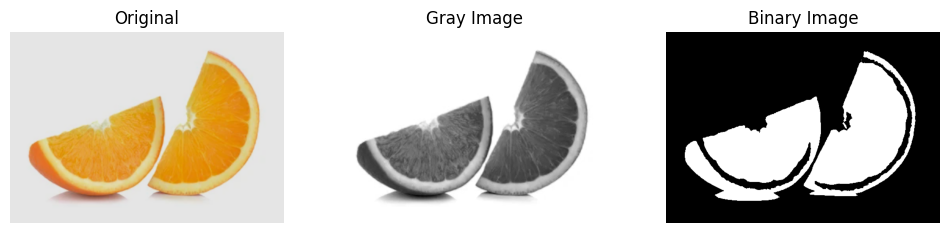

In [18]:
img = cv2.imread('fruit_segment.png')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
thresh, binary_mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(gray, cmap='gray')
plt.title("Gray Image")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(binary_mask, cmap='gray')
plt.title("Binary Image")
plt.axis("off")

plt.show()


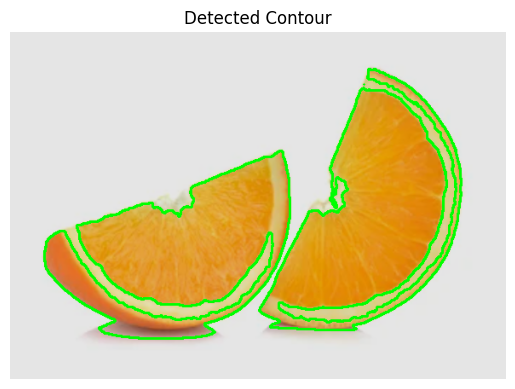

In [19]:
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = img.copy()
cv2.drawContours(contour_img, contours, -1, (0,255,0), 2)
plt.imshow(contour_img)
plt.title("Detected Contour")
plt.axis("off")
plt.show()

In [20]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

ssim_value = ssim(gray, binary_mask)
psnr_value = psnr(gray, binary_mask)

print(f"Otsu's Threshold Value: {thresh:0.2f}")
print(f"SSIM between grayscale and binary mask: {ssim_value:.3f}")
print(f"PSNR between grayscale and binary mask: {psnr_value:.2f} dB")

Otsu's Threshold Value: 177.00
SSIM between grayscale and binary mask: 0.125
PSNR between grayscale and binary mask: 2.08 dB


Segmentation is extremely harsh.

SSIM = 0.125
* It means the binary mask shares almost no structural similarity with the original grayscale image.
* Most grayscale intensity variations and object details are completely lost.

PSNR = 2.08 db
* Very low signal remains indicating severe distortion

Otsu’s thresholding has collapsed the image into overly large black/white regions, discarding meaningful information. 

Edges do not align well since SSIM and PSNR values are low
* Object boundaries are poorly preserved and contour information is lost
* Otsu uses a single threshold value of 177. But fruit images contain shadows and highlights which can violate the thresholds